In [4]:
import pandas as pd
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import load_iris
from sklearn.ensemble import RandomForestRegressor
import os
from sklearn import svm
from sklearn import datasets
from sklearn.svm import SVR

In [5]:
df = pd.read_csv(r"C:\Users\Batia\Downloads\titanic\train.csv")

In [6]:
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


In [7]:
df = df.drop(['Name', 'Ticket', 'Cabin'], axis=1)

df = df.dropna()



In [12]:
df

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,1,0,3,LabelEncoder(),22.0,1,0,7.2500,S
1,2,1,1,LabelEncoder(),38.0,1,0,71.2833,C
2,3,1,3,LabelEncoder(),26.0,0,0,7.9250,S
3,4,1,1,LabelEncoder(),35.0,1,0,53.1000,S
4,5,0,3,LabelEncoder(),35.0,0,0,8.0500,S
...,...,...,...,...,...,...,...,...,...
885,886,0,3,LabelEncoder(),39.0,0,5,29.1250,Q
886,887,0,2,LabelEncoder(),27.0,0,0,13.0000,S
887,888,1,1,LabelEncoder(),19.0,0,0,30.0000,S
889,890,1,1,LabelEncoder(),26.0,0,0,30.0000,C


In [6]:
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler


file_path = r"C:\Users\Batia\Downloads\titanic\train.csv"
data = pd.read_csv(file_path)


age_imputer = SimpleImputer(strategy='median')
data['Age'] = age_imputer.fit_transform(data[['Age']])


embarked_imputer = SimpleImputer(strategy='most_frequent')
label_encoder = LabelEncoder()

data['Embarked'] = label_encoder.fit_transform(data['Embarked'])

# Create a new feature for Cabin availability and drop the original Cabin column
data['HasCabin'] = data['Cabin'].notnull().astype(int)
data.drop(columns=['Cabin'], inplace=True)


label_encoder = LabelEncoder()
data['Sex'] = label_encoder.fit_transform(data['Sex'])
data['Embarked'] = label_encoder.fit_transform(data['Embarked'])


data['Title'] = data['Name'].str.extract(r'([A-Za-z]+)\.', expand=False)
title_mapping = {
    "Mr": 1, "Miss": 2, "Mrs": 3, "Master": 4, "Dr": 5, "Rev": 6, "Col": 7, "Major": 7,
    "Mlle": 2, "Countess": 3, "Ms": 2, "Lady": 3, "Jonkheer": 3, "Don": 1, "Dona": 3,
    "Mme": 3, "Capt": 7, "Sir": 1
}
data['Title'] = data['Title'].map(title_mapping).fillna(0).astype(int)


data.drop(columns=['Name', 'Ticket'], inplace=True)


scaler = StandardScaler()
data['Fare'] = scaler.fit_transform(data[['Fare']])


data.head()


,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,HasCabin,Title
0,1,0,3,1,22.0,1,0,-0.502445,2,0,1
1,2,1,1,0,38.0,1,0,0.786845,0,1,3
2,3,1,3,0,26.0,0,0,-0.488854,2,0,2
3,4,1,1,0,35.0,1,0,0.420730,2,1,3
4,5,0,3,1,35.0,0,0,-0.486337,2,0,1


In [2]:
data['Embarked'].unique()

array(['S', 'C', 'Q', nan], dtype=object)

In [5]:

label_encoder = LabelEncoder()
data['Embarked'] = label_encoder.fit_transform(data['Embarked'])


data['Embarked'].unique()

array([2, 0, 1, 3])

In [7]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


X = data.drop(columns=['Survived', 'PassengerId'])
y = data['Survived']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


log_reg = LogisticRegression(max_iter=1000, random_state=42)
log_reg.fit(X_train, y_train)
log_reg_preds = log_reg.predict(X_test)
log_reg_accuracy = accuracy_score(y_test, log_reg_preds)


rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_preds = rf.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_preds)


log_reg_report = classification_report(y_test, log_reg_preds)
rf_report = classification_report(y_test, rf_preds)


results = {
    "Logistic Regression Accuracy": log_reg_accuracy,
    "Random Forest Accuracy": rf_accuracy,
    "Logistic Regression Report": log_reg_report,
    "Random Forest Report": rf_report,
}

results


{'Logistic Regression Accuracy': 0.7988826815642458,
 'Random Forest Accuracy': 0.8268156424581006,
 'Logistic Regression Report': '              precision    recall  f1-score   support\n\n           0       0.82      0.84      0.83       105\n           1       0.76      0.74      0.75        74\n\n    accuracy                           0.80       179\n   macro avg       0.79      0.79      0.79       179\nweighted avg       0.80      0.80      0.80       179\n',
 'Random Forest Report': '              precision    recall  f1-score   support\n\n           0       0.84      0.87      0.85       105\n           1       0.80      0.77      0.79        74\n\n    accuracy                           0.83       179\n   macro avg       0.82      0.82      0.82       179\nweighted avg       0.83      0.83      0.83       179\n'}

In [28]:
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier


train_file_path = r"C:\Users\Batia\Downloads\titanic\train.csv"
test_file_path = r"C:\Users\Batia\Downloads\titanic\test.csv"

train_data = pd.read_csv(train_file_path)
test_data = pd.read_csv(test_file_path)


age_imputer = SimpleImputer(strategy='median')
fare_imputer = SimpleImputer(strategy='median')
embarked_imputer = SimpleImputer(strategy='most_frequent')
scaler = StandardScaler()
label_encoder = LabelEncoder()

# Preprocess training data
train_data['Age'] = age_imputer.fit_transform(train_data[['Age']])
train_data['Fare'] = fare_imputer.fit_transform(train_data[['Fare']])
train_data['Embarked'] = label_encoder.fit_transform(train_data[['Embarked']])
train_data['HasCabin'] = train_data['Cabin'].notnull().astype(int)
train_data.drop(columns=['Cabin'], inplace=True)
train_data['Sex'] = label_encoder.fit_transform(train_data['Sex'])
train_data['Embarked'] = label_encoder.fit_transform(train_data['Embarked'])
train_data['Title'] = train_data['Name'].str.extract(r'([A-Za-z]+)\.', expand=False).map({
    "Mr": 1, "Miss": 2, "Mrs": 3, "Master": 4, "Dr": 5, "Rev": 6, "Col": 7, "Major": 7,
    "Mlle": 2, "Countess": 3, "Ms": 2, "Lady": 3, "Jonkheer": 3, "Don": 1, "Dona": 3,
    "Mme": 3, "Capt": 7, "Sir": 1
}).fillna(0).astype(int)
train_data.drop(columns=['Name', 'Ticket'], inplace=True)
train_data['Fare'] = scaler.fit_transform(train_data[['Fare']])

X_train = train_data.drop(columns=['Survived', 'PassengerId'])
y_train = train_data['Survived']

# Preprocess test data
test_data['Age'] = age_imputer.transform(test_data[['Age']])
test_data['Fare'] = fare_imputer.transform(test_data[['Fare']])
test_data['Embarked'] = label_encoder.fit_transform(test_data[['Embarked']])
test_data['HasCabin'] = test_data['Cabin'].notnull().astype(int)
test_data.drop(columns=['Cabin'], inplace=True)
test_data['Sex'] = label_encoder.fit_transform(test_data['Sex'])
test_data['Embarked'] = label_encoder.fit_transform(test_data['Embarked'])
test_data['Title'] = test_data['Name'].str.extract(r'([A-Za-z]+)\.', expand=False).map({
    "Mr": 1, "Miss": 2, "Mrs": 3, "Master": 4, "Dr": 5, "Rev": 6, "Col": 7, "Major": 7,
    "Mlle": 2, "Countess": 3, "Ms": 2, "Lady": 3, "Jonkheer": 3, "Don": 1, "Dona": 3,
    "Mme": 3, "Capt": 7, "Sir": 1
}).fillna(0).astype(int)
test_data.drop(columns=['Name', 'Ticket'], inplace=True)
test_data['Fare'] = scaler.transform(test_data[['Fare']])

X_test = test_data.drop(columns=['PassengerId'])


log_reg = LogisticRegression(max_iter=1000, random_state=42)
rf = RandomForestClassifier(n_estimators=100, random_state=42)

log_reg.fit(X_train, y_train)
rf.fit(X_train, y_train)


test_data['Survived'] = rf.predict(X_test)


submission = test_data[['PassengerId', 'Survived']]
submission_file_path = r"C:\Users\Batia\Downloads\titanic\submission.csv"
submission.to_csv(submission_file_path, index=False)

submission_file_path


c:\Users\Batia\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\Batia\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


'C:\\Users\\Batia\\Downloads\\titanic\\submission.csv'

In [30]:
submission_correct = test_data[['PassengerId', 'Survived']]


assert submission_correct.shape[0] == 418, "must have 418 rows."


submission_file_path_correct = r"C:\Users\Batia\Downloads\titanic\submission_correct.csv"
submission_correct.to_csv(submission_file_path_correct, index=False)

submission_file_path_correct

'C:\\Users\\Batia\\Downloads\\titanic\\submission_correct.csv'

In [31]:
submission_correct = test_data[['PassengerId', 'Survived']]
submission_correct.to_csv('submission.csv', index=False)
print("Submission file saved as submission.csv")

Submission file saved as submission.csv


In [32]:
dfe = pd.read_csv(r"C:\Users\Batia\Downloads\didmiesciai.csv", sep=';', encoding='windows-1257')

C:\Users\Batia\AppData\Local\Temp\ipykernel_24708\848747025.py:1: DtypeWarning: Columns (3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  dfe = pd.read_csv(r"C:\Users\Batia\Downloads\didmiesciai.csv", sep=';', encoding='windows-1257')


In [40]:
df1 = pd.read_csv(r"C:\Users\Batia\Downloads\didmiesciai(1).csv", sep=';', encoding='windows-1257')

C:\Users\Batia\AppData\Local\Temp\ipykernel_24708\330458314.py:1: DtypeWarning: Columns (3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(r"C:\Users\Batia\Downloads\didmiesciai(1).csv", sep=';', encoding='windows-1257')


In [41]:
dfe1 = pd.concat([dfe, df1])

In [33]:
dfe

,REGIONAS,SUT_TIPAS,SUT_GAM,GV_TIPAS,GEN_GALIA,KWH01,KWH02,KWH03,KWH04,KWH05,KWH06
0,Vilniaus regionas,KV,NaN,NaN,0,3459470.8,3389592.8,3656872.6,3631011.4,3591220.6,3698914.8
1,Vilniaus regionas,KV,NaN,NaN,NaN,3459470.8,3389592.8,3656872.6,3631011.4,3591220.6,3698914.8
2,Vilniaus regionas,KV,NaN,NaN,NaN,3459470.8,3389592.8,3656872.6,3631011.4,3591220.6,3698914.8
3,Vilniaus regionas,KV,NaN,NaN,NaN,3459470.8,3389592.8,3656872.6,3631011.4,3591220.6,3698914.8
4,Vilniaus regionas,KV,NaN,NaN,0,3459470.8,3389592.8,3656872.6,3631011.4,3591220.6,3698914.8
...,...,...,...,...,...,...,...,...,...,...,...
1015558,Kauno regionas,BV,NaN,NaN,NaN,-9916.0,0.0,0.0,0.0,0.0,0.0
1015559,Kauno regionas,KV,T,NaN,30,-13210.0,7.0,6.0,5.0,5.0,5.0
1015560,Kauno regionas,KV,NaN,NaN,NaN,-25787.0,3039.0,2828.0,2300.0,2005.0,1228.0
1015561,Kauno regionas,BV,NaN,NaN,NaN,-15969.0,372.0,172.0,175.0,182.0,168.0


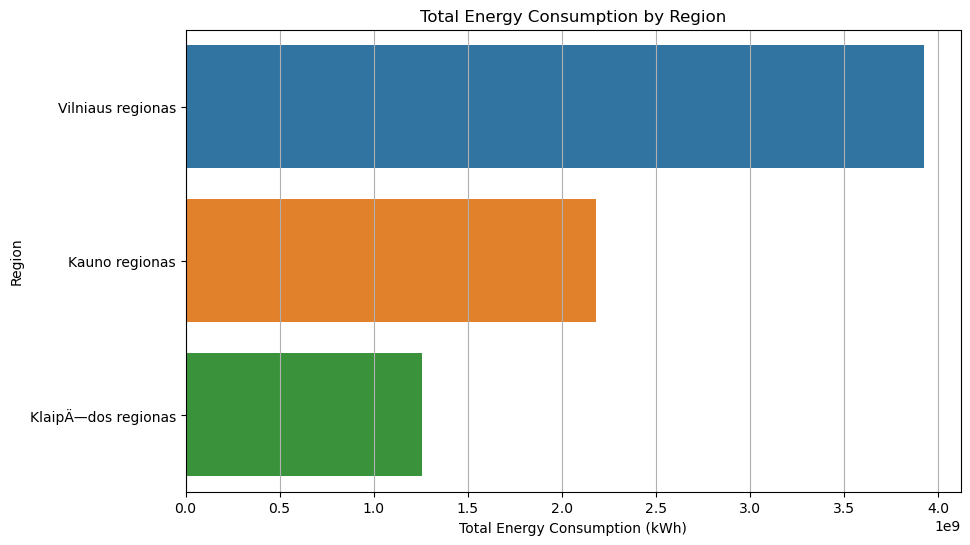

In [42]:
dfe1['Total_Consumption'] = dfe1.sum(numeric_only=True, axis=1)

region_trends = dfe1.groupby('REGIONAS').sum(numeric_only=True).reset_index()


plt.figure(figsize=(10, 6))
sns.barplot(x='Total_Consumption', y='REGIONAS', data=region_trends, order=region_trends.sort_values('Total_Consumption', ascending=False)['REGIONAS'])
plt.title('Total Energy Consumption by Region')
plt.xlabel('Total Energy Consumption (kWh)')
plt.ylabel('Region')
plt.grid(axis='x')
plt.show()

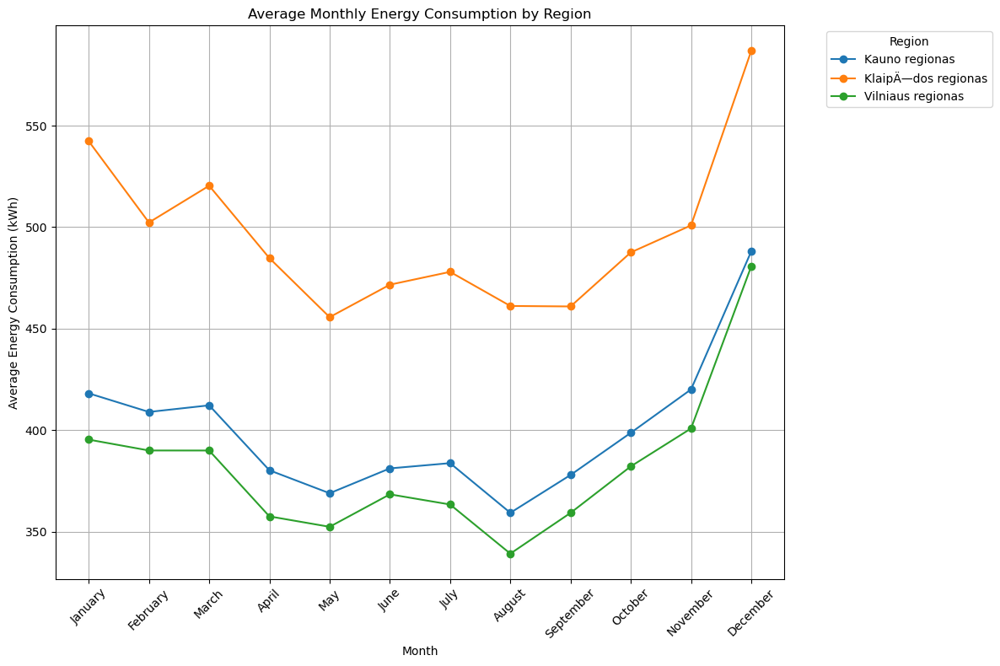

In [43]:
monthly_trends = dfe1.groupby('REGIONAS')[
    ['KWH01', 'KWH02', 'KWH03', 'KWH04', 'KWH05', 'KWH06',
     'KWH07', 'KWH08', 'KWH09', 'KWH10', 'KWH11', 'KWH12']
].mean().transpose()


monthly_trends.index = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]


plt.figure(figsize=(12, 8))
for region in monthly_trends.columns:
    plt.plot(monthly_trends.index, monthly_trends[region], marker='o', label=region)

plt.title('Average Monthly Energy Consumption by Region')
plt.xlabel('Month')
plt.ylabel('Average Energy Consumption (kWh)')
plt.xticks(rotation=45)
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.tight_layout()
plt.show()

Line plot rodo menesio energijos vartojima kiekvienam regionui. Mes galime matyti sezonines variacijos, tokias kaip didesni ar mazesni energijos vartojima per tam tikrus menesius. 

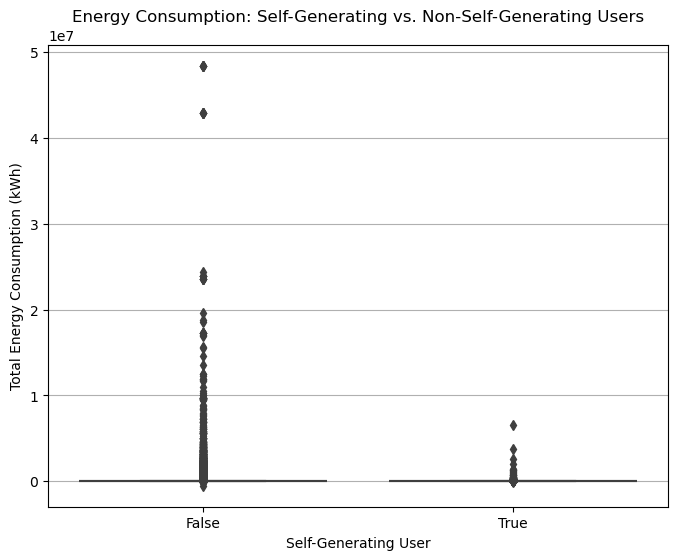

In [49]:

self_generators = dfe1[dfe1['GV_TIPAS'] == 'Gaminantis vartotojas']


dfe1['Self_Generating'] = dfe1['GV_TIPAS'] == 'Gaminantis vartotojas'
plt.figure(figsize=(8, 6))
sns.boxplot(x='Self_Generating', y='Total_Consumption', data=dfe1)
plt.title('Energy Consumption: Self-Generating vs. Non-Self-Generating Users')
plt.xlabel('Self-Generating User')
plt.ylabel('Total Energy Consumption (kWh)')
plt.grid(axis='y')
plt.show()




# 1. Boxplot reveals the overall consumption differences between self-generating and non-self-generating users.

c:\Users\Batia\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


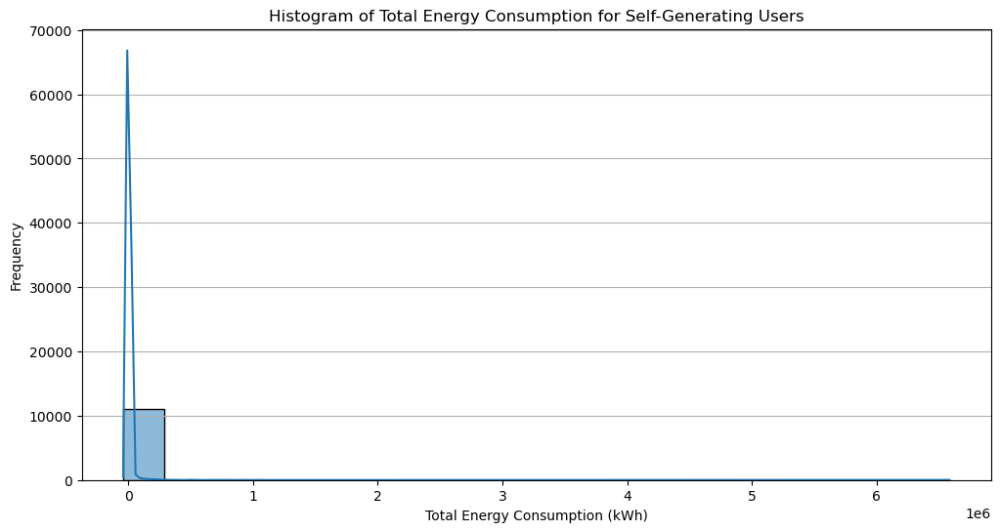

In [47]:
plt.figure(figsize=(12, 6))
sns.histplot(data=self_generators, x='Total_Consumption', bins=20, kde=True)
plt.title('Histogram of Total Energy Consumption for Self-Generating Users')
plt.xlabel('Total Energy Consumption (kWh)')
plt.ylabel('Frequency')
plt.grid(axis='y')
plt.show()

c:\Users\Batia\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Batia\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Batia\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Batia\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

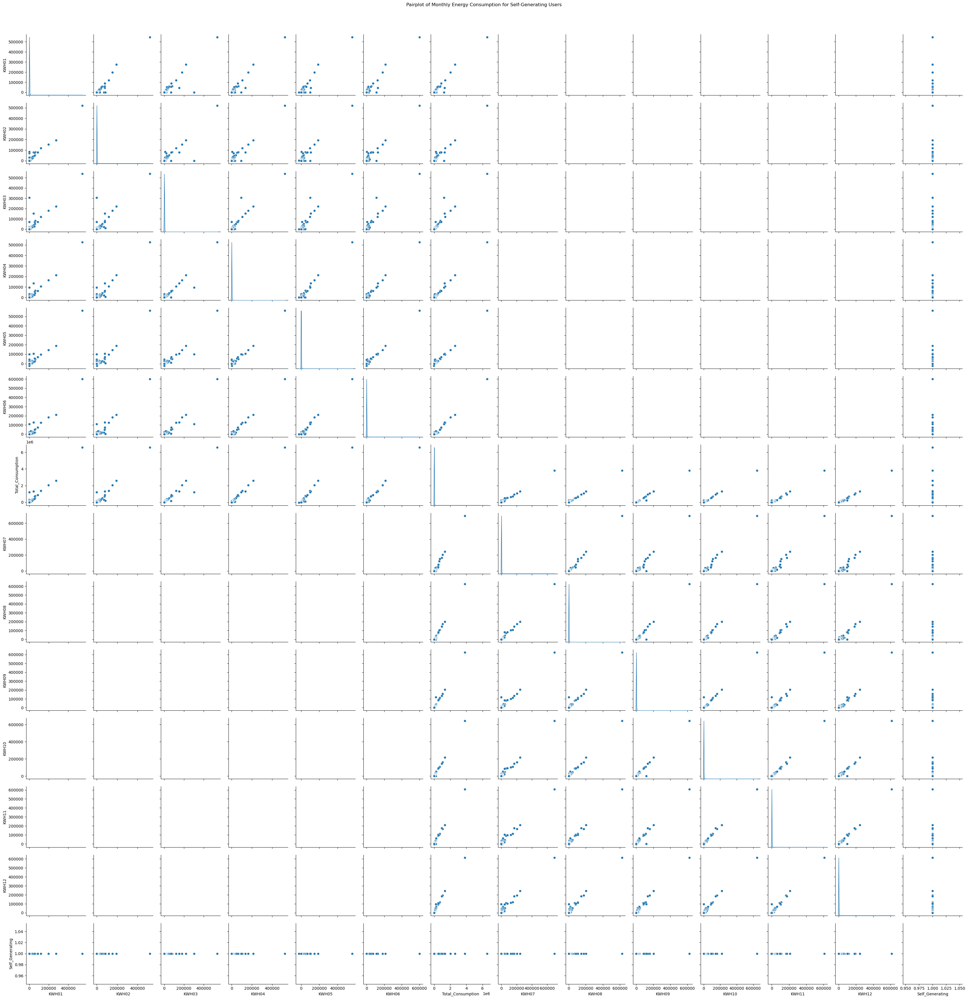

In [50]:
# Pairplot: Exploring relationships between monthly energy consumption
sns.pairplot(self_generators, diag_kind='kde')
plt.suptitle('Pairplot of Monthly Energy Consumption for Self-Generating Users', y=1.02)
plt.show()

c:\Users\Batia\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


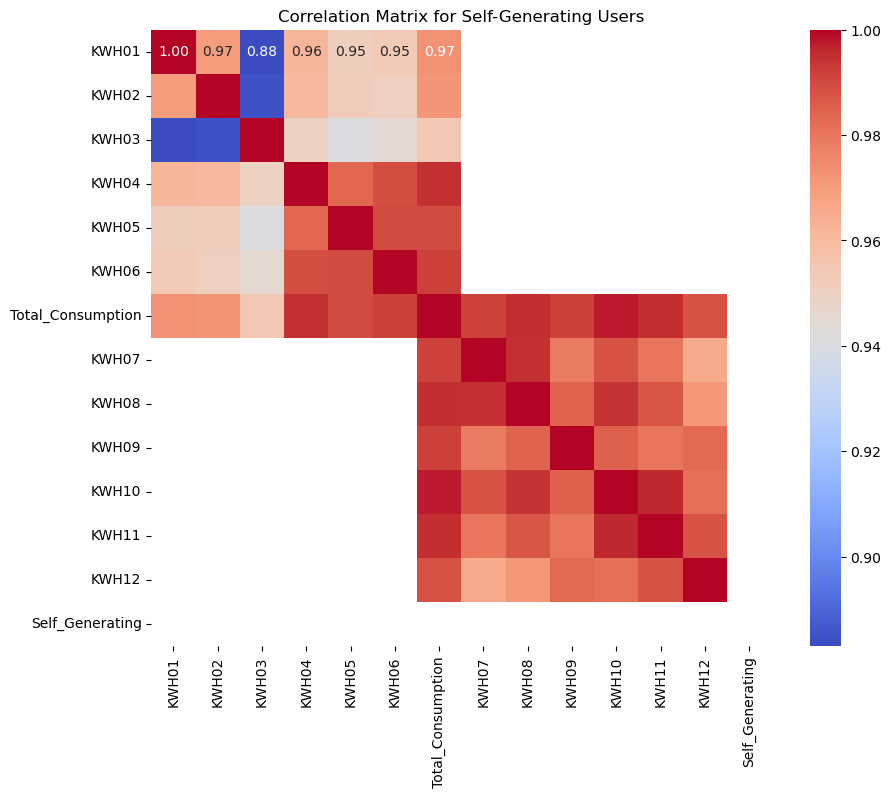

In [53]:
# Heatmap: Correlation analysis for self-generating users
corr_matrix = self_generators.iloc[:, 5:].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Correlation Matrix for Self-Generating Users')
plt.show()

In [55]:
import plotly.express as px


dfe1['Total_Consumption'] = dfe1.iloc[:, 5:].sum(axis=1)
territory_avg = dfe1.groupby('REGIONAS')['Total_Consumption'].mean().reset_index()
territory_avg.columns = ['REGIONAS', 'Avg_Consumption']


data_sample = dfe1.merge(territory_avg, on='REGIONAS', how='left')


data_sample['High_Consumption'] = data_sample['Total_Consumption'] > 1.3 * data_sample['Avg_Consumption']


region_coordinates = {
    "Vilniaus regionas": {"lat": 54.6872, "lon": 25.2797},
    "Kauno regionas": {"lat": 54.8969, "lon": 23.8924},
    "Klaipėdos regionas": {"lat": 55.7033, "lon": 21.1443},
    "Šiaulių regionas": {"lat": 55.9333, "lon": 23.3167},
    "Panevėžio regionas": {"lat": 55.7333, "lon": 24.35},
}

data_sample['lat'] = data_sample['REGIONAS'].map(lambda x: region_coordinates.get(x, {}).get('lat', None))
data_sample['lon'] = data_sample['REGIONAS'].map(lambda x: region_coordinates.get(x, {}).get('lon', None))


map_data = data_sample[data_sample['High_Consumption'] & data_sample['lat'].notnull() & data_sample['lon'].notnull()]


map_data['Size'] = map_data['Total_Consumption'].astype(float).tolist()


fig = px.scatter_mapbox(
    map_data,
    lat='lat',
    lon='lon',
    size='Size',
    color='REGIONAS',
    hover_name='REGIONAS',
    title="High Energy Consumption Territories",
    mapbox_style="carto-positron",
    size_max=50,
    zoom=6,
)


fig.show()


C:\Users\Batia\AppData\Local\Temp\ipykernel_24708\2069830502.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_data['Size'] = map_data['Total_Consumption'].astype(float).tolist()


In [8]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import numpy as np


train_data = pd.read_csv(r"C:\Users\Batia\Downloads\home-data-for-ml-course\train.csv")
test_data = pd.read_csv(r"C:\Users\Batia\Downloads\home-data-for-ml-course\test.csv")


X = train_data.drop(columns=['SalePrice', 'Id'])
y = train_data['SalePrice']


X = pd.get_dummies(X, drop_first=True)
test_data = pd.get_dummies(test_data, drop_first=True)


X, test_data = X.align(test_data, join='left', axis=1)


X.fillna(X.median(), inplace=True)
test_data.fillna(test_data.median(), inplace=True)


X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)


models = {
    'LinearRegression': LinearRegression(),
    'DecisionTreeRegressor': DecisionTreeRegressor(random_state=42),
    'RandomForestRegressor': RandomForestRegressor(random_state=42)
}


results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, preds))
    results[name] = rmse


results


{'LinearRegression': 49257.876263538434,
 'DecisionTreeRegressor': 42437.952708219425,
 'RandomForestRegressor': 29308.971897028347}

In [3]:
remaining_nans = test_data.isnull().sum()
remaining_nans = remaining_nans[remaining_nans > 0]

remaining_nans

Utilities_NoSeWa       1459
Condition2_RRAe        1459
Condition2_RRAn        1459
Condition2_RRNn        1459
HouseStyle_2.5Fin      1459
RoofMatl_CompShg       1459
RoofMatl_Membran       1459
RoofMatl_Metal         1459
RoofMatl_Roll          1459
Exterior1st_ImStucc    1459
Exterior1st_Stone      1459
Exterior2nd_Other      1459
Heating_GasA           1459
Heating_OthW           1459
Electrical_Mix         1459
GarageQual_Fa          1459
PoolQC_Fa              1459
MiscFeature_TenC       1459
dtype: int64

In [10]:

missing_train = X.isnull().sum()
print("Missing values in training dataset:\n", missing_train[missing_train > 0])


missing_test = test_data.isnull().sum()
print("Missing values in test dataset:\n", missing_test[missing_test > 0])


X.fillna(X.median(), inplace=True)
test_data.fillna(test_data.median(), inplace=True)


remaining_missing_train = X.isnull().sum().sum()
remaining_missing_test = test_data.isnull().sum().sum()

print(f"Remaining NaN values in training dataset: {remaining_missing_train}")
print(f"Remaining NaN values in test dataset: {remaining_missing_test}")


X, test_data = X.align(test_data, join='left', axis=1)


X.fillna(0, inplace=True)
test_data.fillna(0, inplace=True)


Missing values in training dataset:
 Series([], dtype: int64)
Missing values in test dataset:
 Utilities_NoSeWa       1459
Condition2_RRAe        1459
Condition2_RRAn        1459
Condition2_RRNn        1459
HouseStyle_2.5Fin      1459
RoofMatl_CompShg       1459
RoofMatl_Membran       1459
RoofMatl_Metal         1459
RoofMatl_Roll          1459
Exterior1st_ImStucc    1459
Exterior1st_Stone      1459
Exterior2nd_Other      1459
Heating_GasA           1459
Heating_OthW           1459
Electrical_Mix         1459
GarageQual_Fa          1459
PoolQC_Fa              1459
MiscFeature_TenC       1459
dtype: int64
Remaining NaN values in training dataset: 0
Remaining NaN values in test dataset: 26262


In [11]:

test_data.fillna(0, inplace=True)


remaining_missing_test = test_data.isnull().sum().sum()
print(f"Remaining NaN values in test dataset after final handling: {remaining_missing_test}")



best_model = RandomForestRegressor(random_state=42)
X.fillna(X.median(), inplace=True)


test_data.fillna(test_data.median(), inplace=True)

best_model.fit(X, y)  


X.fillna(X.median(), inplace=True)
test_data.fillna(test_data.median(), inplace=True)

test_preds = best_model.predict(test_data)

submission = pd.DataFrame({
    'Id': test_data.index + 1,  
    'SalePrice': test_preds
})


submission.to_csv(r"C:\Users\Batia\Downloads\home-data-for-ml-course\submission.csv", index=False)



Remaining NaN values in test dataset after final handling: 0


In [ ]:

original_test_data = pd.read_csv(r"C:\Users\Batia\Downloads\home-data-for-ml-course\test.csv")


submission = pd.DataFrame({
    'Id': original_test_data['Id'],  
    'SalePrice': test_preds
})


if submission.shape[0] != 1459:
    raise ValueError(f"Submission should have 1459 rows, but it has {submission.shape[0]} rows.")


submission.to_csv(r"C:\Users\Batia\Downloads\home-data-for-ml-course\submission.csv", index=False)

